## CLUSTERING OF TIME SERIES - p53 dynamics 

Using Self organising maps and kmeans clustering techniques


In [130]:
# Native libraries
import os
import math
import logging

#  Essential libraries
import pandas as pd
from scipy.integrate import simps
from scipy.signal import correlate
import numpy as np

# Plotting libraries
import matplotlib.pyplot as plt

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Preprocessing
from sklearn.preprocessing import MinMaxScaler
from tslearn.generators import random_walks

# Algorithms
from minisom import MiniSom
from tslearn.barycenters import dtw_barycenter_averaging
from tslearn.clustering import TimeSeriesKMeans
from sklearn.cluster import KMeans

from sklearn.decomposition import PCA
from tslearn.clustering import TimeSeriesKMeans


In [131]:
# Load time series datasets for different doses 
p53_0G  = pd.read_csv('/Users/nehabinish/Desktop/granada internship/data intro analysis/p53_0G.csv'  , header=None, delimiter=",")
p53_2G  = pd.read_csv('/Users/nehabinish/Desktop/granada internship/data intro analysis/p53_2G.csv'  , header=None, delimiter=",")
p53_4G  = pd.read_csv('/Users/nehabinish/Desktop/granada internship/data intro analysis/p53_4G.csv'  , header=None, delimiter=",")
p53_10G = pd.read_csv('/Users/nehabinish/Desktop/granada internship/data intro analysis/p53_10G.csv' , header=None, delimiter=",")

In [132]:
# No of cells/Time points
Tpoints_0G = p53_0G.shape[0]
Ncells_0G  = p53_0G.shape[1]

In [133]:
print(np.shape(p53_0G))
p53_0G =  np.array(p53_0G)
p530G_tr = np.transpose(p53_0G)
print(np.shape(p530G_tr))

#p530G_tr = np.reshape(p530G_tr,(Ncells_0G,Tpoints_0G,1))
#print(np.shape(p530G_tr))

tseries = p530G_tr.tolist()
print(len(tseries))
print(type(tseries))

(240, 383)
(383, 240)
383
<class 'list'>


### 2. 3. Clustering
Twodifferent methods for clustering these series. The first of the methods is Self Organizing Maps(SOM) and the other method is K-Means.

### 2. 3. 1. SOM

Self-organizing maps are a type of neural network that is trained using unsupervised learning to produce a low-dimensional representation of the input space of the training samples, called a map.

Averaged Time series in a cluster


In [141]:
som_x = som_y = math.ceil(math.sqrt(math.sqrt(len(tseries))))
print(som_x,som_y)

5 5


In [142]:
som = MiniSom(som_x, som_y,len(tseries[0]), sigma=0.3, learning_rate = 0.5)

In [143]:
som.random_weights_init(tseries)
som.train(tseries, 50000)

In [150]:
def plot_som_series_averaged_center_eudist(som_x, som_y, win_map):
    fig, axs = plt.subplots(som_x,som_y,figsize=(25,25))
    fig.suptitle('Clusters')
    for x in range(som_x):
        for y in range(som_y):
            cluster = (x,y)
            if cluster in win_map.keys():
                for series in win_map[cluster]:
                    axs[cluster].plot(series,c="gray",alpha=0.5) 
                axs[cluster].plot(np.average(np.vstack(win_map[cluster]),axis=0),c="red")
            cluster_number = x*som_y+y+1
            axs[cluster].set_title(f"Cluster {cluster_number}")

    plt.show()

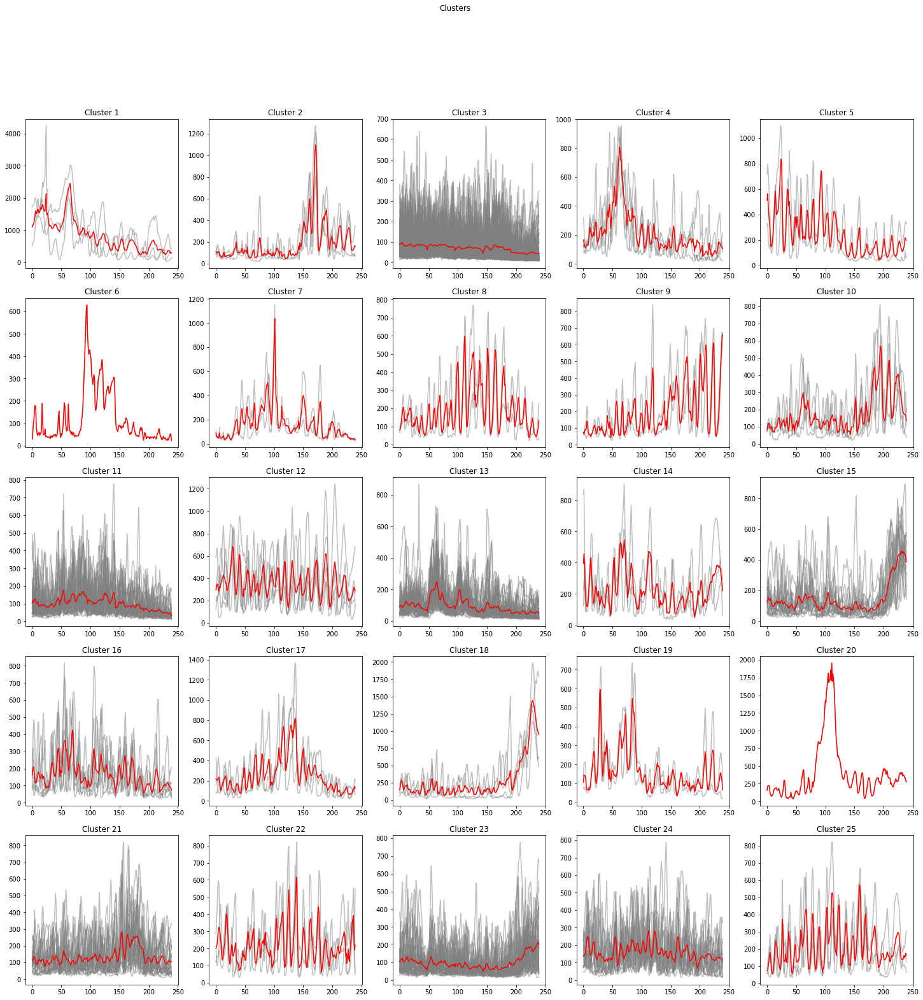

In [151]:
win_map = som.win_map(tseries)
# Returns the mapping of the winner nodes and inputs
plot_som_series_averaged_center_eudist(som_x, som_y, win_map)

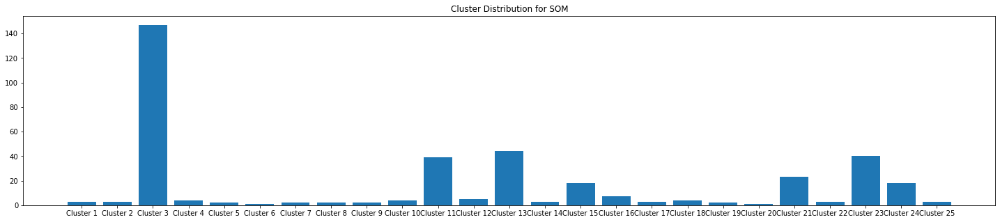

In [152]:
cluster_c = []
cluster_n = []
for x in range(som_x):
    for y in range(som_y):
        cluster = (x,y)
        if cluster in win_map.keys():
            cluster_c.append(len(win_map[cluster]))
        else:
            cluster_c.append(0)
        cluster_number = x*som_y+y+1
        cluster_n.append(f"Cluster {cluster_number}")

plt.figure(figsize=(25,5))
plt.title("Cluster Distribution for SOM")
plt.bar(cluster_n,cluster_c)
plt.show()

### Dynamic Time Warping Barycenter Averaging (DBA)

Maybe more interesting - To extract average movement/shape of the cluster instead of averaging each series in the cluster. 
DBA is another type of averaging method that used the Dynamic Time Warping method in it and might be very useful to extract the movement/shape of the cluster.

In [154]:
def plot_som_series_dba_center(som_x, som_y, win_map):
    fig, axs = plt.subplots(som_x,som_y,figsize=(25,25))
    fig.suptitle('Clusters')
    for x in range(som_x):
        for y in range(som_y):
            cluster = (x,y)
            if cluster in win_map.keys():
                for series in win_map[cluster]:
                    axs[cluster].plot(series,c="gray",alpha=0.5) 
                axs[cluster].plot(dtw_barycenter_averaging(np.vstack(win_map[cluster])),c="red") # tw_barycenter_averaging
            cluster_number = x*som_y+y+1
            axs[cluster].set_title(f"Cluster {cluster_number}")

    plt.show()

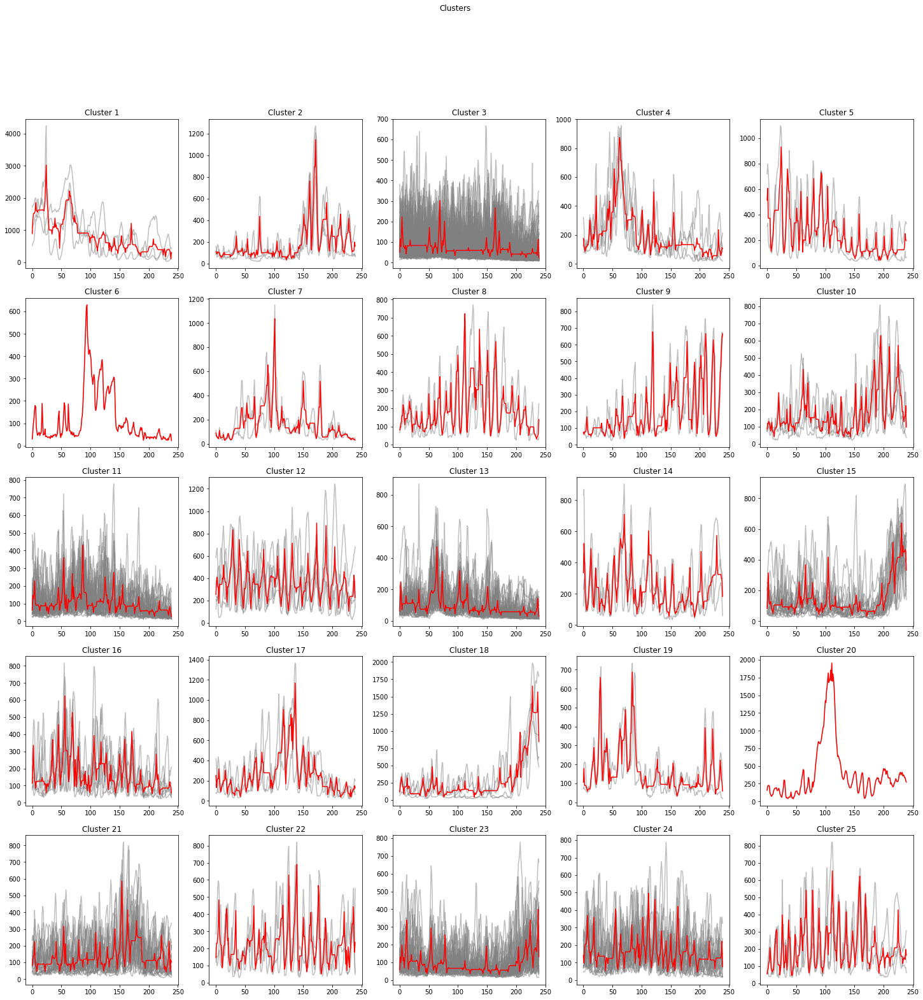

In [155]:
plot_som_series_dba_center(som_x, som_y, win_map)

### K-Means Clustering

N input to k clusters in which each data point belongs to cluster with the nearest mean (cluster centroid)

Removing time indices from our time series, and instead of measured values at each time point, we accept them as different features and dimensions of a single data point.

Also need to select a distance metric for k-mean clustering
1. Euclidean Distance (like in DBA)
2. Dynamic Time Warping (DTW)

In [204]:
cluster_count = 2
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")
labels = km.fit_predict(tseries)

0
1


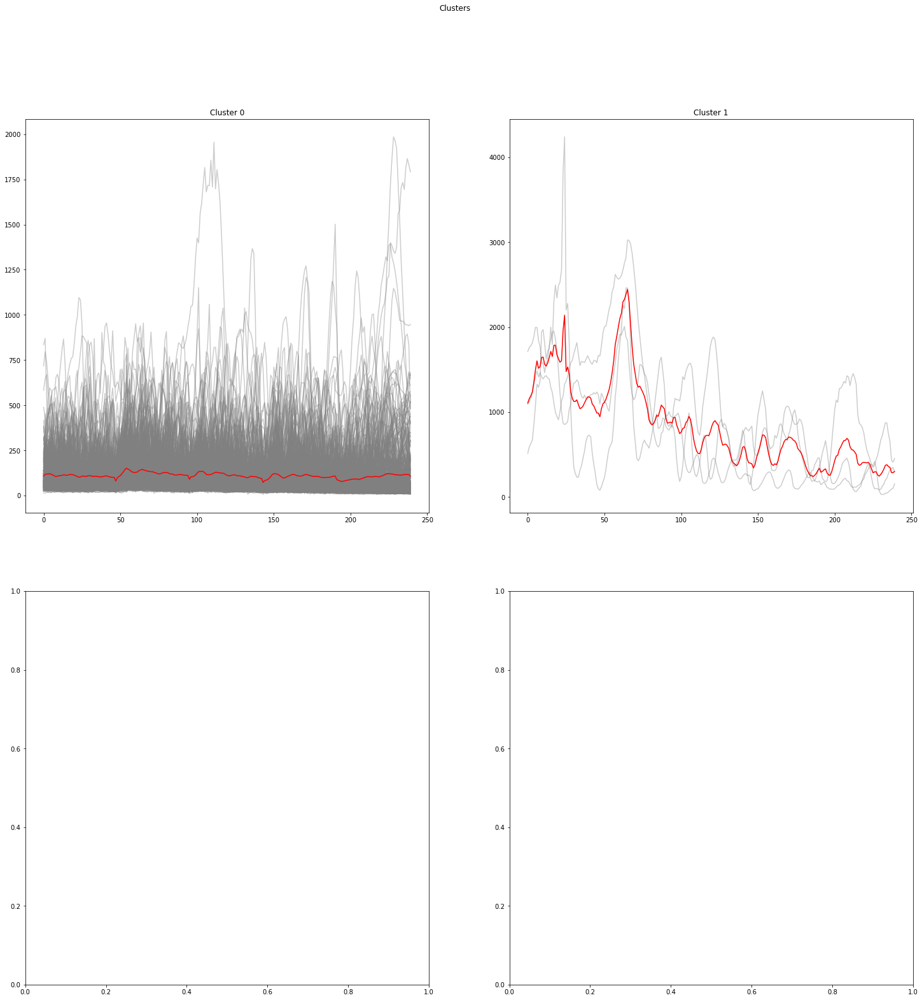

(2,)


/Users/nehabinish/opt/anaconda3/lib/python3.9/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


In [216]:
plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
vals = []
for label in set(labels):
    cluster = []
    print(label)
    for i in range(len(labels)):
            if(labels[i]==label):              
                axs[row_i, column_j].plot(tseries[i],c="gray",alpha=0.4)
                cluster.append(tseries[i])
    vals.append(cluster)           
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()


240


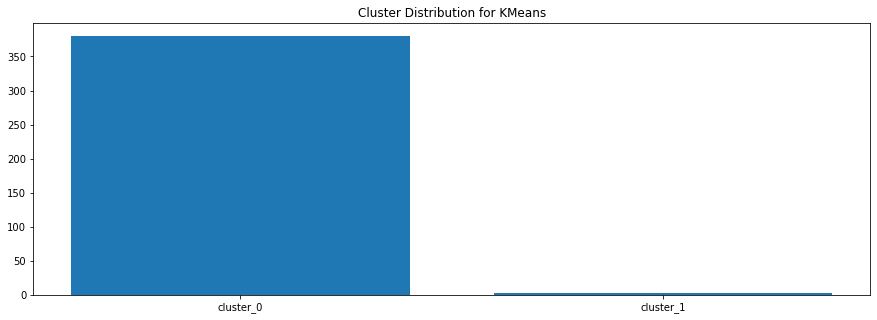

In [164]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

In [165]:
cluster_count = 3
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")
labels = km.fit_predict(tseries)

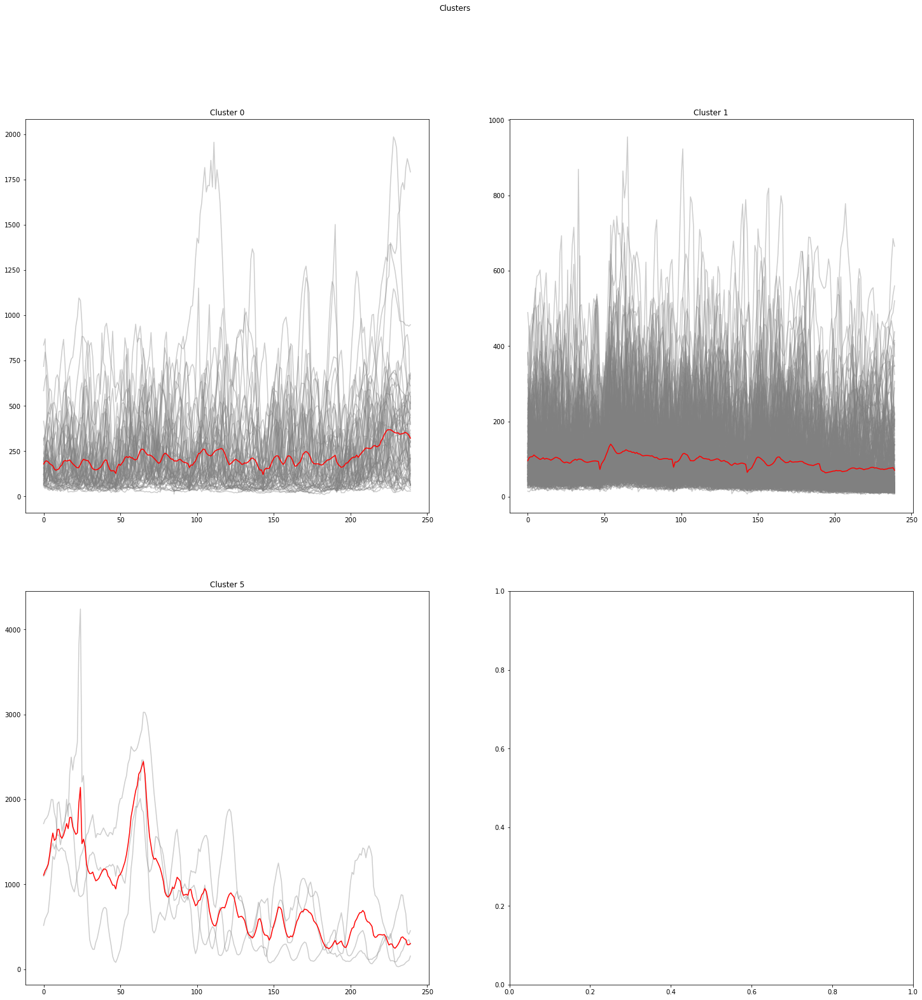

In [166]:
plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(tseries[i],c="gray",alpha=0.4)
                cluster.append(tseries[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

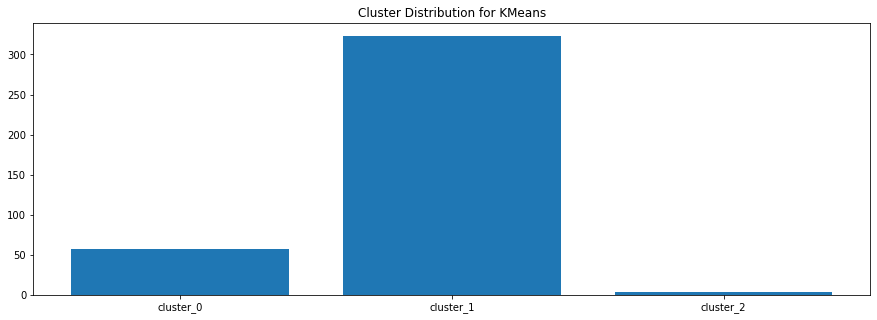

In [167]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

### p53 - 2 Gy condition

1. DBA - Dynamic Time Warping Barycenter Averaging (DBA)

In [169]:
print(np.shape(p53_2G))
p53_2G =  np.array(p53_2G)
p532G_tr = np.transpose(p53_2G)
print(np.shape(p532G_tr))

tseries2G = p532G_tr.tolist()
print(len(tseries2G))
print(type(tseries2G))

(240, 892)
(892, 240)
892
<class 'list'>


### CLUSTER COUNT = 2

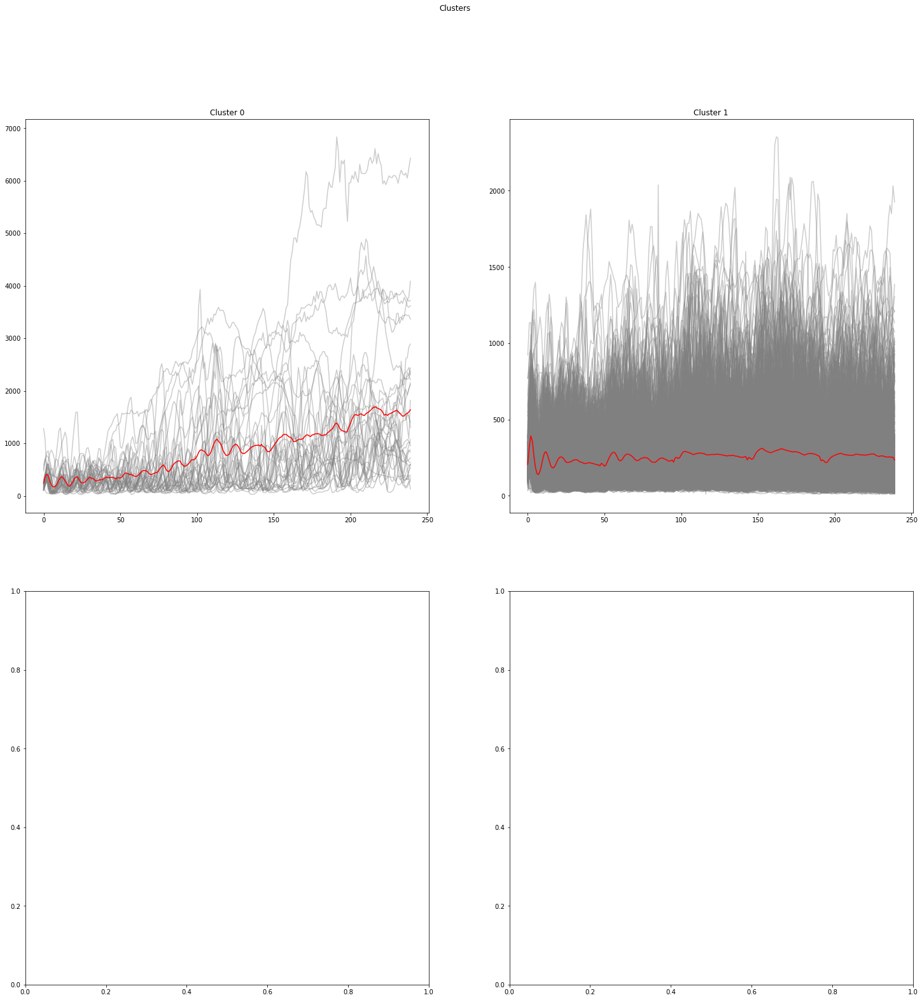

In [170]:
cluster_count = 2
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")
labels = km.fit_predict(tseries2G)

plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(tseries2G[i],c="gray",alpha=0.4)
                cluster.append(tseries2G[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

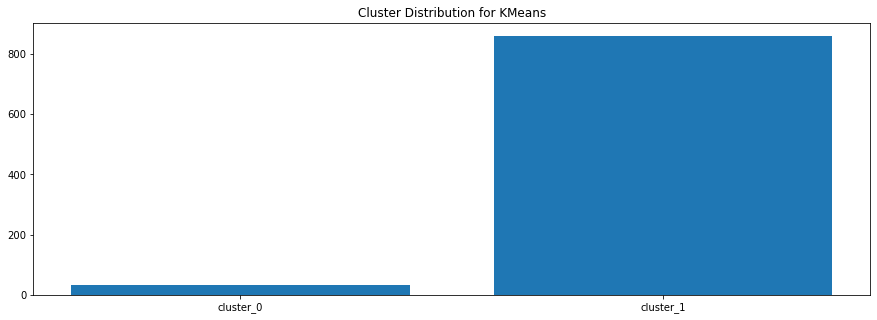

In [171]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

### CLUSTER COUNT = 3

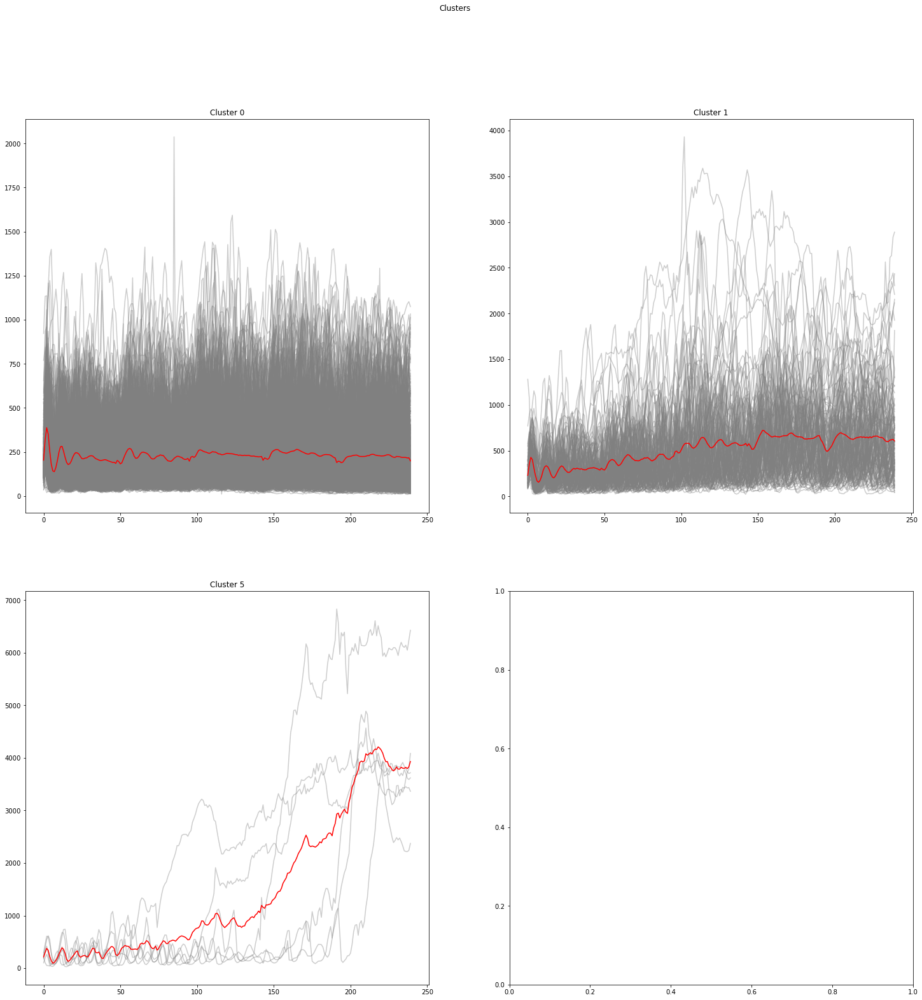

In [172]:
cluster_count = 3
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")
labels = km.fit_predict(tseries2G)

plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(tseries2G[i],c="gray",alpha=0.4)
                cluster.append(tseries2G[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

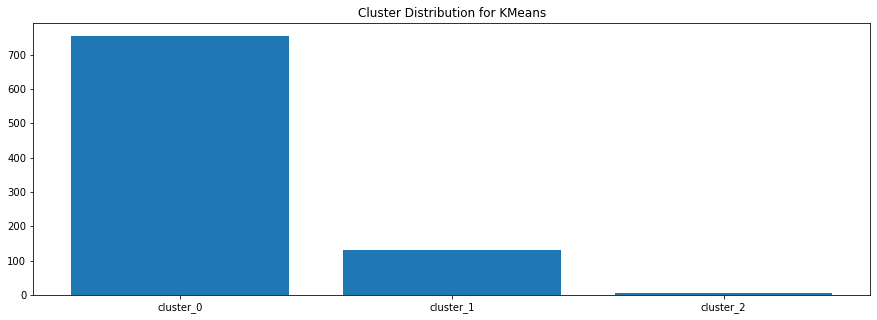

In [173]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

### CLUSTER COUNT = 4

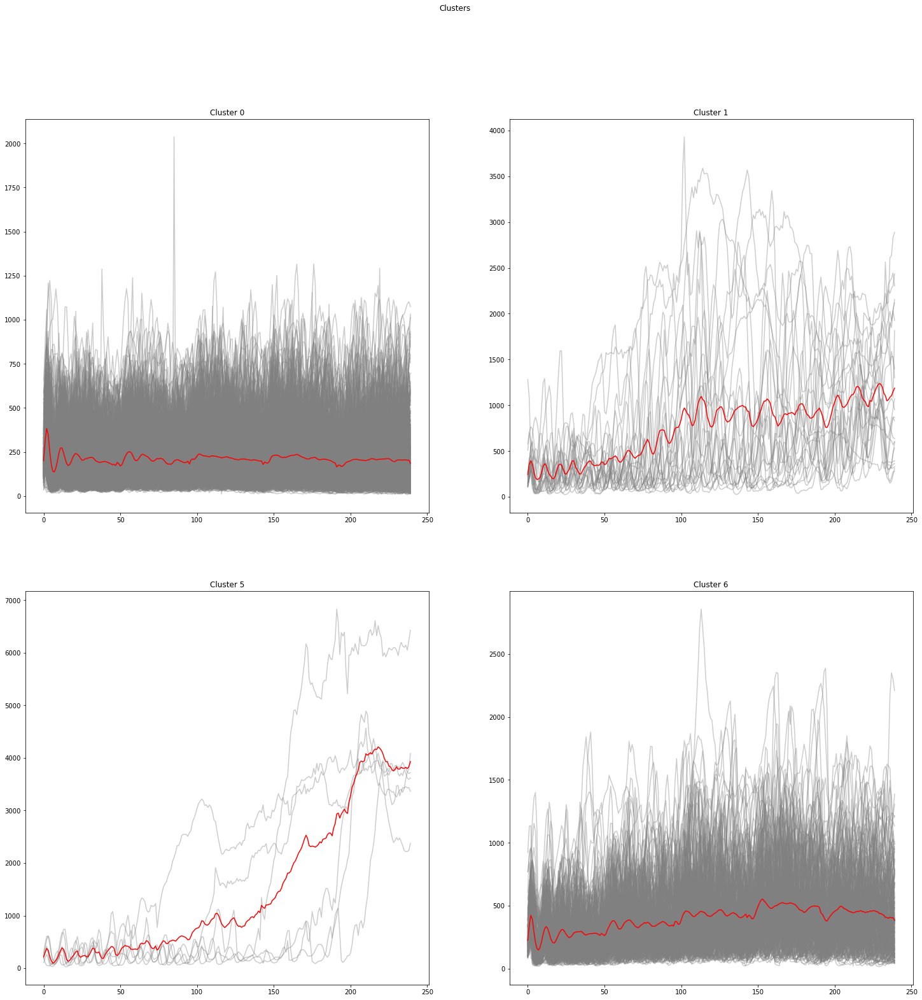

In [174]:
cluster_count = 4
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")
labels = km.fit_predict(tseries2G)

plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(tseries2G[i],c="gray",alpha=0.4)
                cluster.append(tseries2G[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

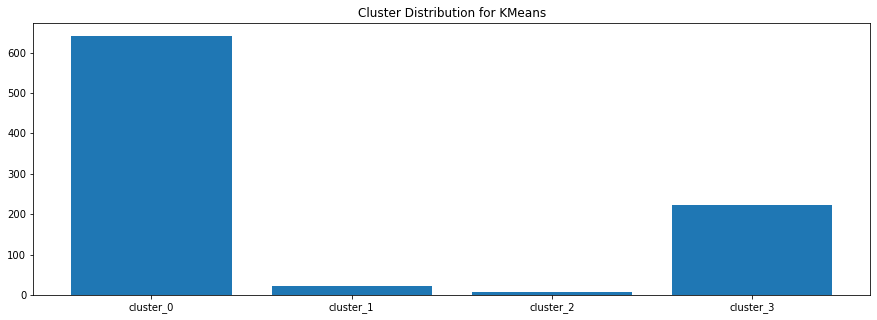

In [175]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

### CLUSTER COUNT = 5

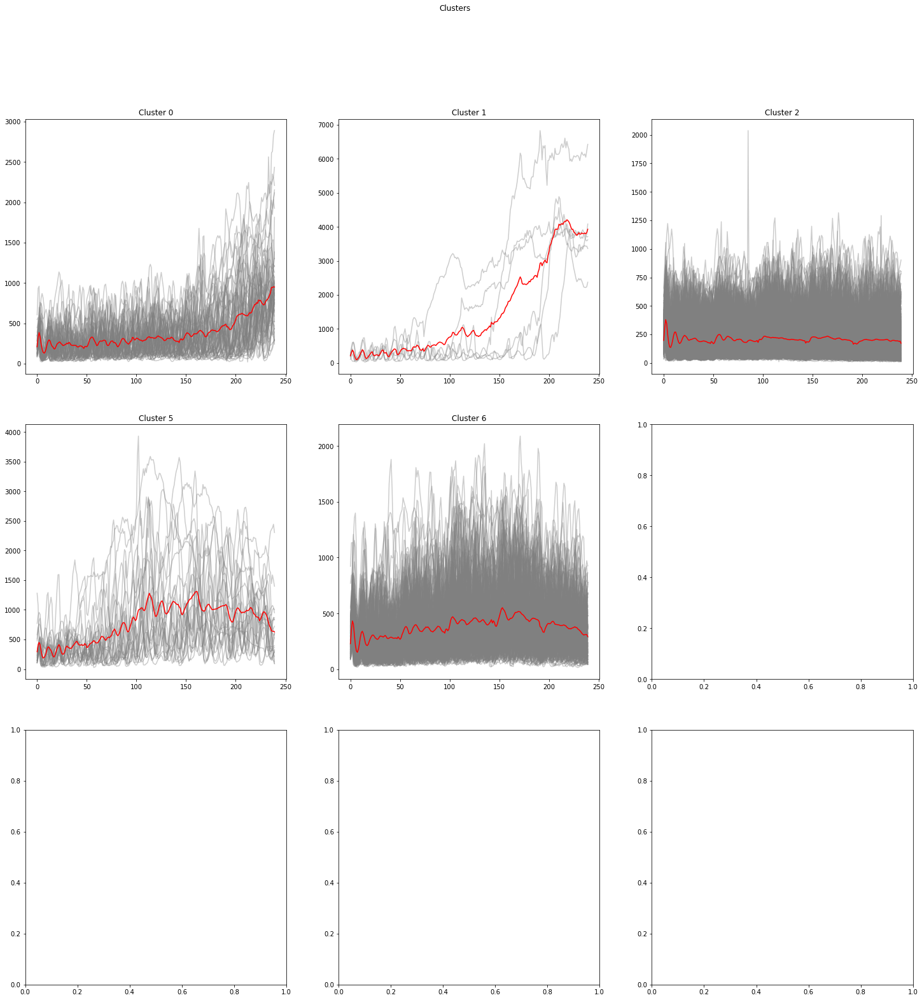

In [190]:
cluster_count = 5
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")
labels = km.fit_predict(tseries2G)

plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(tseries2G[i],c="gray",alpha=0.4)
                cluster.append(tseries2G[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

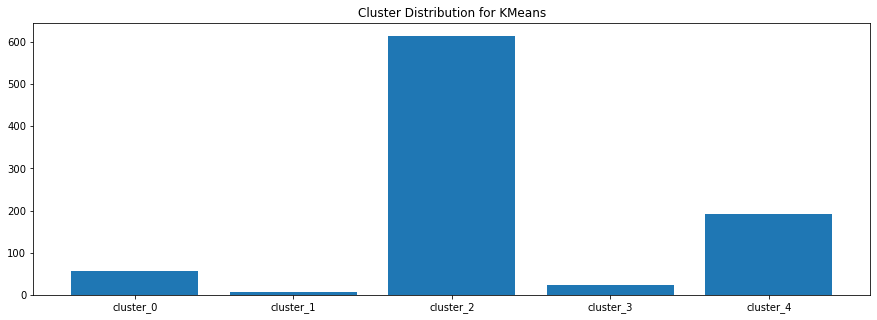

In [191]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

### p53 - 4 Gy condition

In [176]:
print(np.shape(p53_4G))
p53_4G =  np.array(p53_4G)
p534G_tr = np.transpose(p53_4G)
print(np.shape(p534G_tr))

tseries4G = p534G_tr.tolist()
print(len(tseries4G))
print(type(tseries4G))

(240, 739)
(739, 240)
739
<class 'list'>


### CLUSTER COUNT = 2

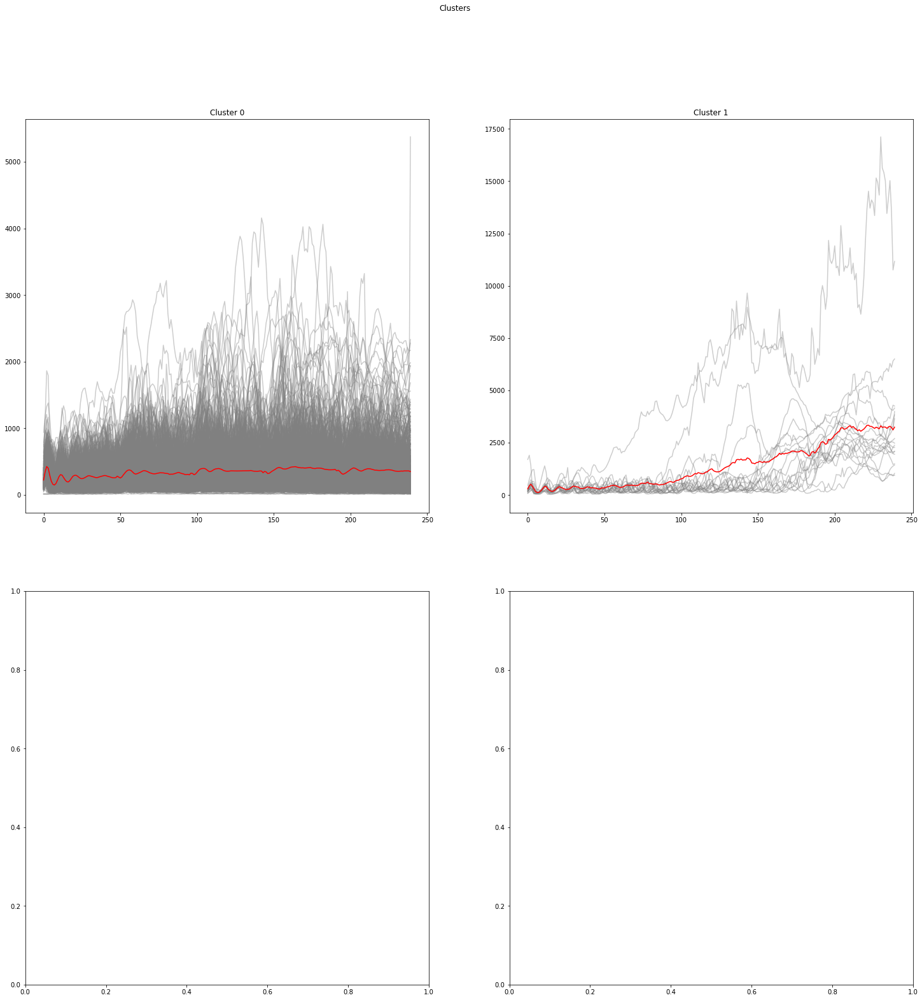

In [177]:
cluster_count = 2
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")
labels = km.fit_predict(tseries4G)

plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(tseries4G[i],c="gray",alpha=0.4)
                cluster.append(tseries4G[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

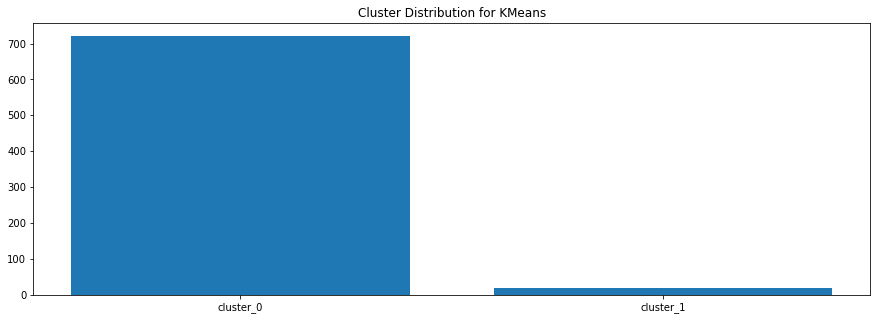

In [178]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

### CLUSTER COUNT = 3

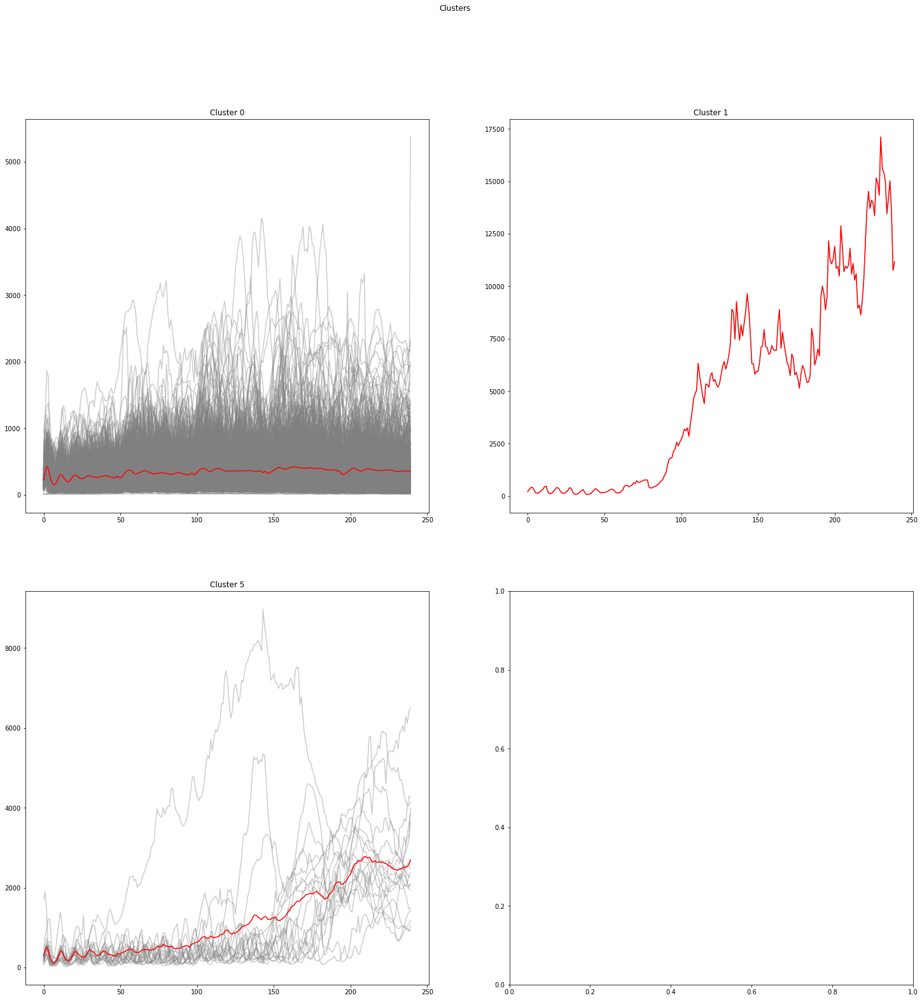

In [179]:
cluster_count = 3
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")
labels = km.fit_predict(tseries4G)

plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(tseries4G[i],c="gray",alpha=0.4)
                cluster.append(tseries4G[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

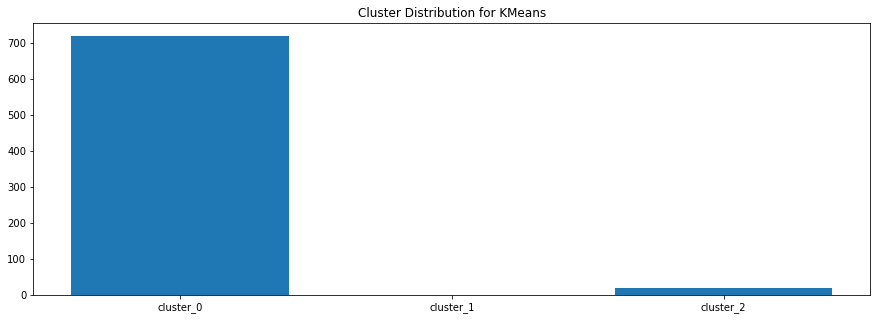

In [180]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

### CLUSTER COUNT = 4

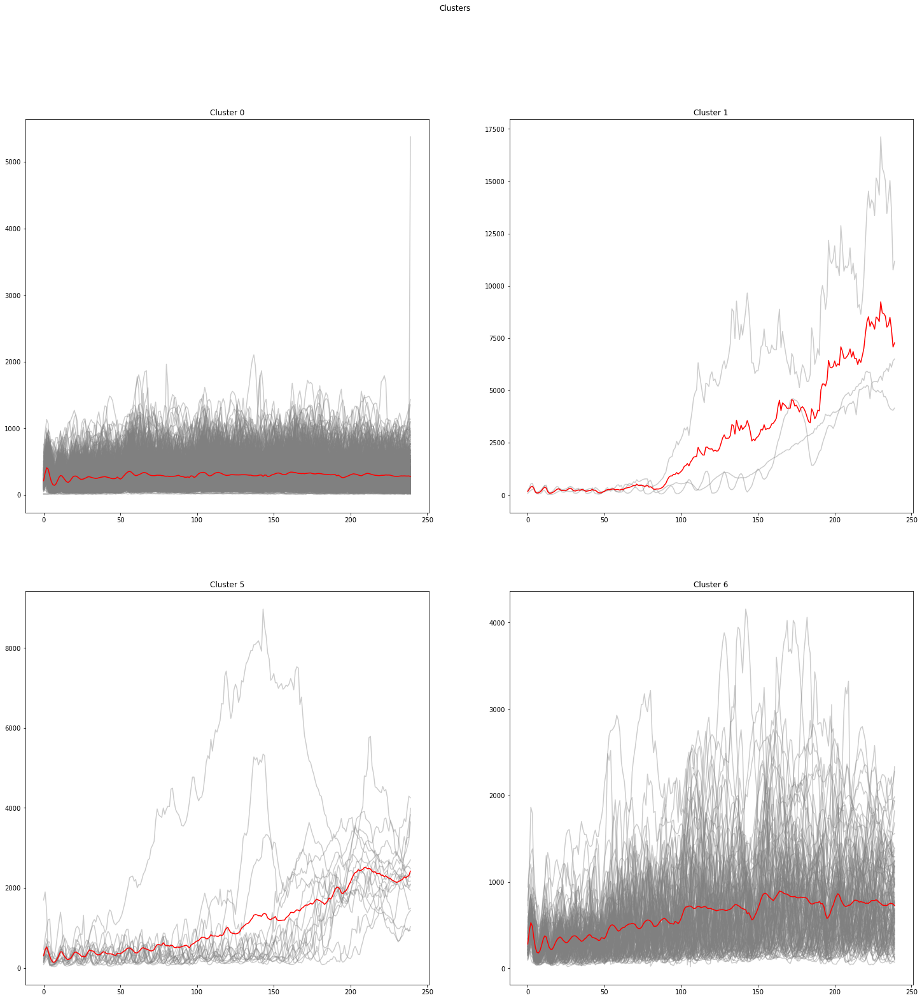

In [181]:
cluster_count = 4
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")
labels = km.fit_predict(tseries4G)

plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(tseries4G[i],c="gray",alpha=0.4)
                cluster.append(tseries4G[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

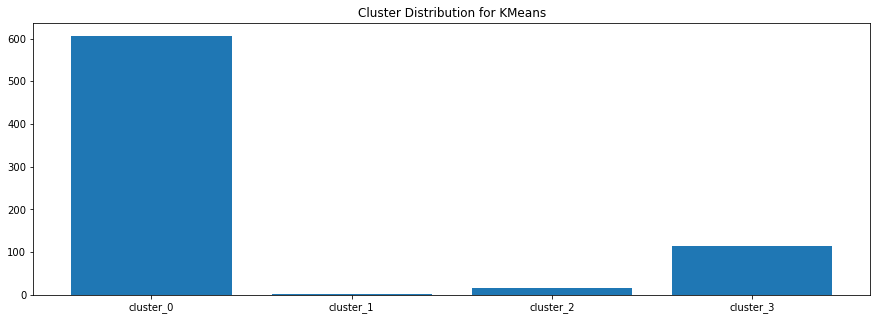

In [182]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

### p53 - 10 Gy condition

In [183]:
print(np.shape(p53_10G))
p53_10G =  np.array(p53_10G)
p5310G_tr = np.transpose(p53_10G)
print(np.shape(p5310G_tr))

tseries10G = p5310G_tr.tolist()
print(len(tseries10G))
print(type(tseries10G))

(240, 842)
(842, 240)
842
<class 'list'>


#### CLUSTER COUNT = 2

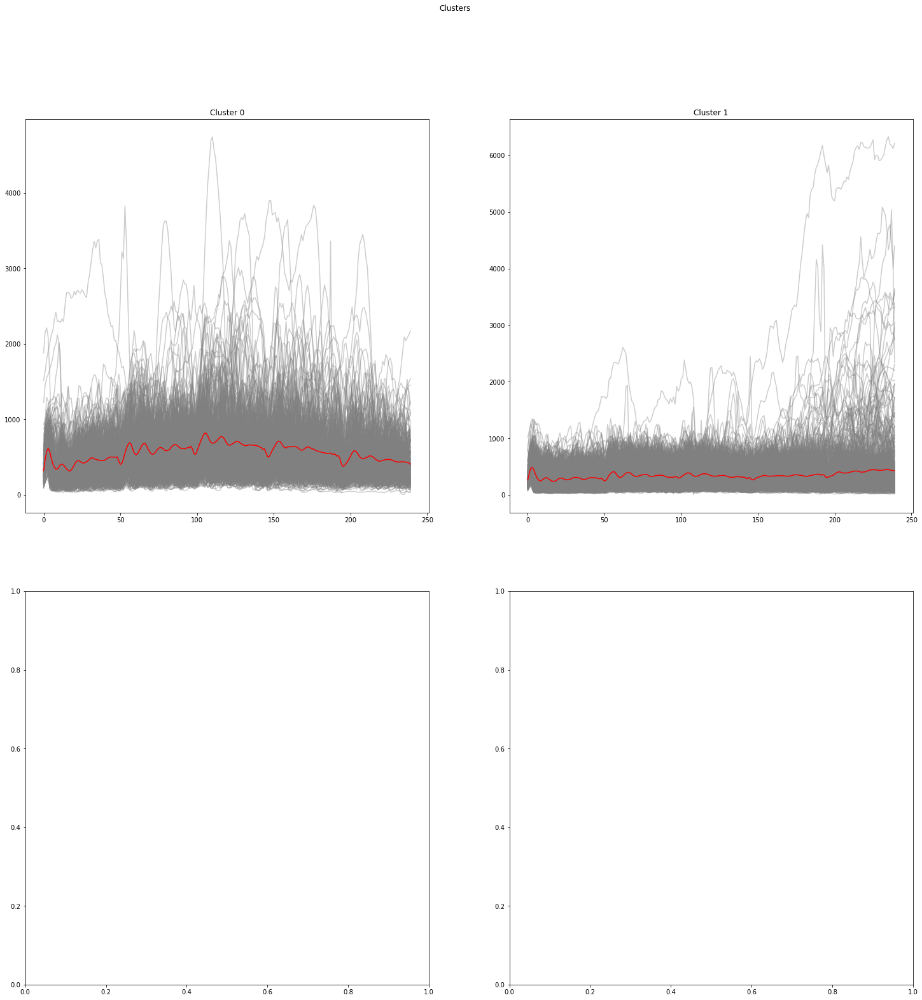

In [184]:
cluster_count = 2
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")
labels = km.fit_predict(tseries10G)

plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(tseries10G[i],c="gray",alpha=0.4)
                cluster.append(tseries10G[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

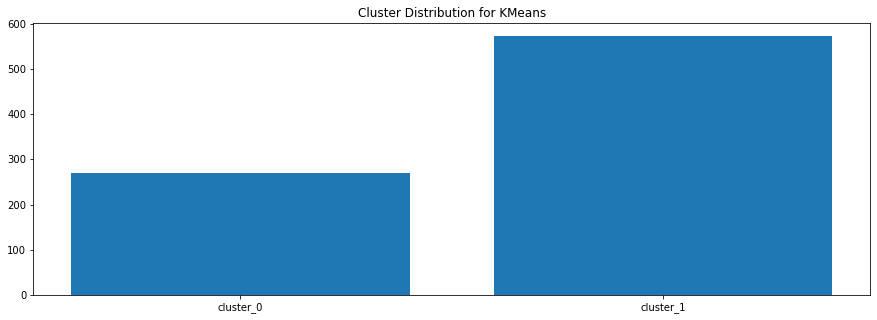

In [185]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

### CLUSTER COUNT = 3

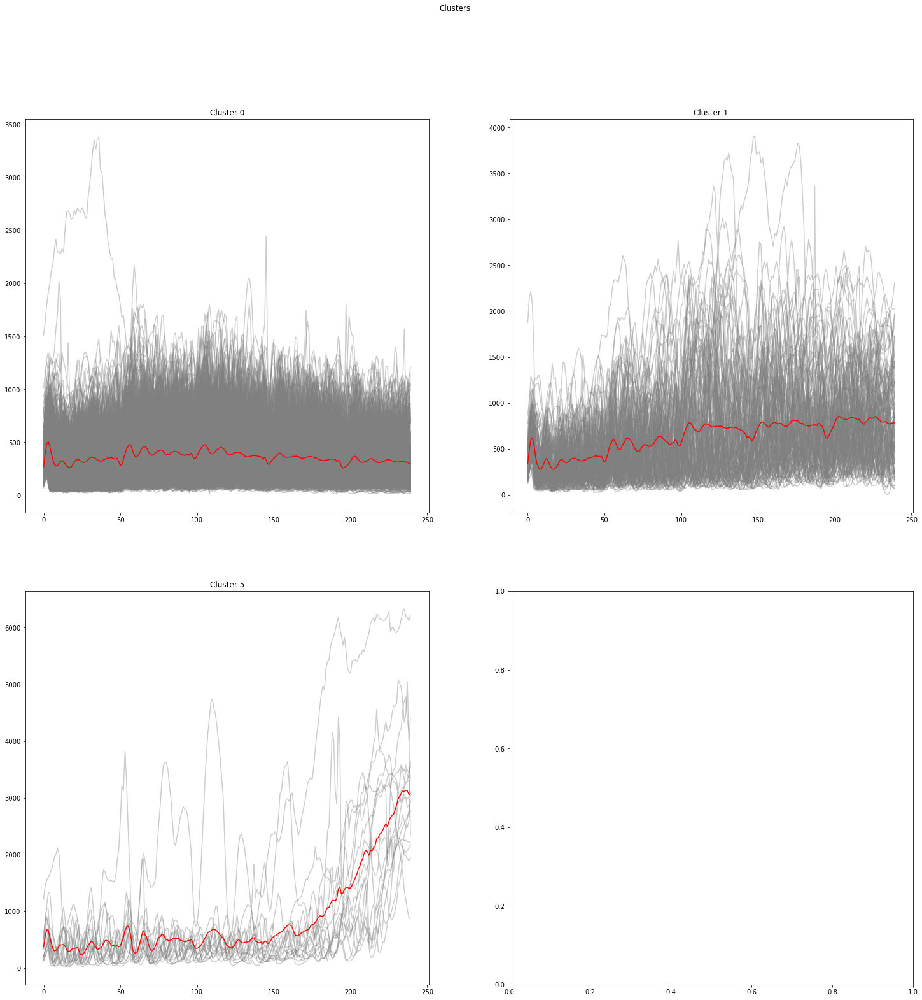

In [186]:
cluster_count = 3
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")
labels = km.fit_predict(tseries10G)

plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(tseries10G[i],c="gray",alpha=0.4)
                cluster.append(tseries10G[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

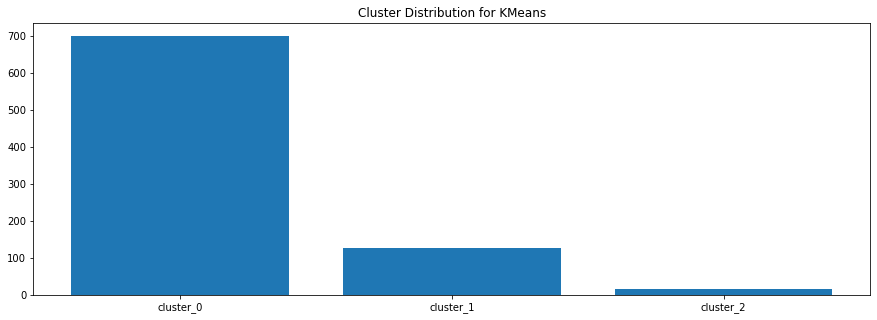

In [187]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

### CLUSTER COUNT = 4

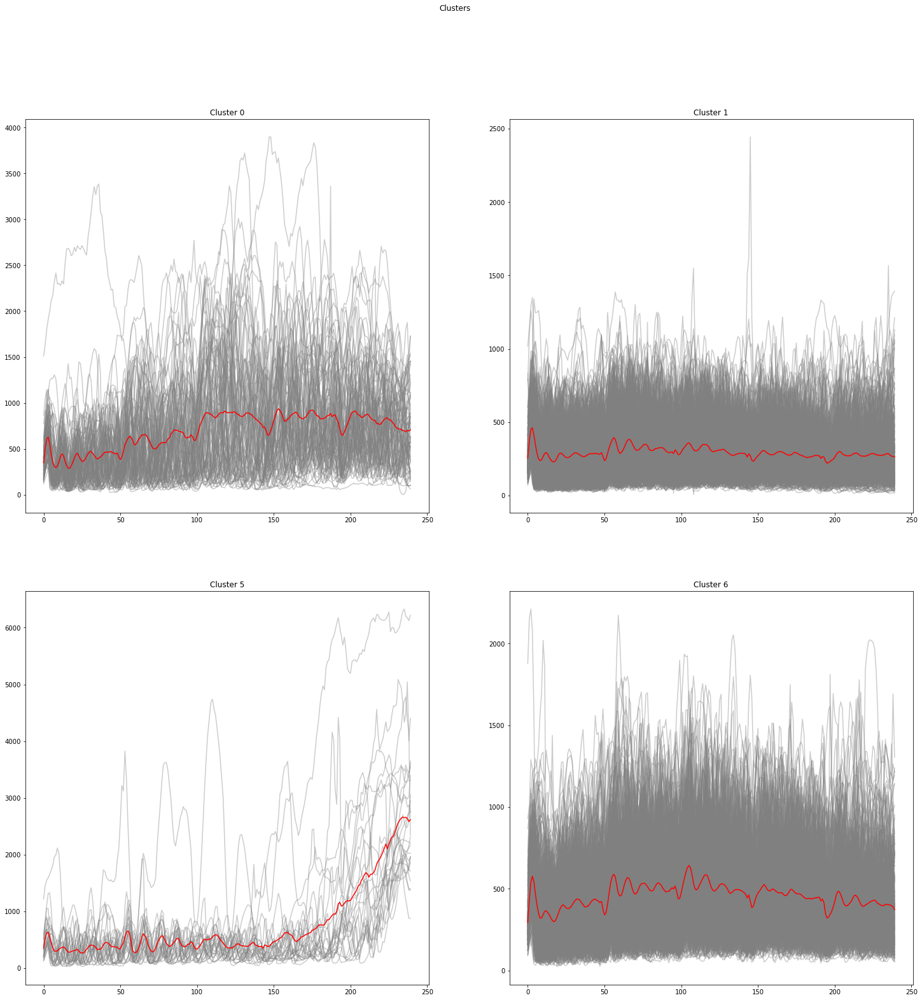

In [188]:
cluster_count = 4
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw")
labels = km.fit_predict(tseries10G)

plot_count = math.ceil(math.sqrt(cluster_count))
fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
fig.suptitle('Clusters')
row_i=0
column_j=0
# For each label there is,
# plots every series with that label
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(tseries10G[i],c="gray",alpha=0.4)
                cluster.append(tseries10G[i])
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

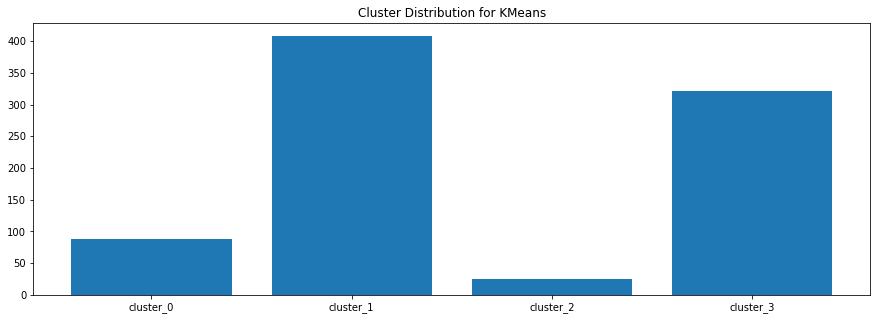

In [189]:
cluster_c = [len(labels[labels==i]) for i in range(cluster_count)]
cluster_n = ["cluster_"+str(i) for i in range(cluster_count)]
plt.figure(figsize=(15,5))
plt.title("Cluster Distribution for KMeans")
plt.bar(cluster_n,cluster_c)
plt.show()

### MIXED CLUSTERING - SOM

In [193]:
# Load time series datasets for different doses 
p53_0G  = pd.read_csv('/Users/nehabinish/Desktop/granada internship/data intro analysis/p53_0G.csv'  , header=None, delimiter=",")
p53_2G  = pd.read_csv('/Users/nehabinish/Desktop/granada internship/data intro analysis/p53_2G.csv'  , header=None, delimiter=",")
p53_4G  = pd.read_csv('/Users/nehabinish/Desktop/granada internship/data intro analysis/p53_4G.csv'  , header=None, delimiter=",")
p53_10G = pd.read_csv('/Users/nehabinish/Desktop/granada internship/data intro analysis/p53_10G.csv' , header=None, delimiter=",")

p53_0G  = p53_0G .T 
p53_0G  = p53_0G.values.tolist()

p53_2G  = p53_2G .T 
p53_2G = p53_2G.values.tolist()

p53_4G  = p53_4G .T 
p53_4G = p53_4G.values.tolist()

p53_10G  = p53_10G .T 
p53_10G = p53_10G.values.tolist()

In [194]:
print(len(p53_0G))

383


In [195]:
#%% MIX CLUSTERS

p53 = []
alldose  = [p53_0G, p53_2G, p53_4G, p53_10G]
dosename = ['0Gy','2Gy','4Gy','10Gy',]

for (dose,k) in zip(alldose,range(4)):    
    Ncells  = len(dose)                 # Total cells per dose condition   

    for n in range(0,Ncells):
        p53.append(dose[n])

Total_cells = len(p53)  
print(Total_cells) 

2856


In [196]:
som_x = som_y = math.ceil(math.sqrt(math.sqrt(len(p53))))
print(som_x,som_y)

8 8


In [198]:
som = MiniSom(som_x, som_y,len(p53[0]), sigma=0.3, learning_rate = 0.5)
som.random_weights_init(p53)
som.train(p53, 50000)

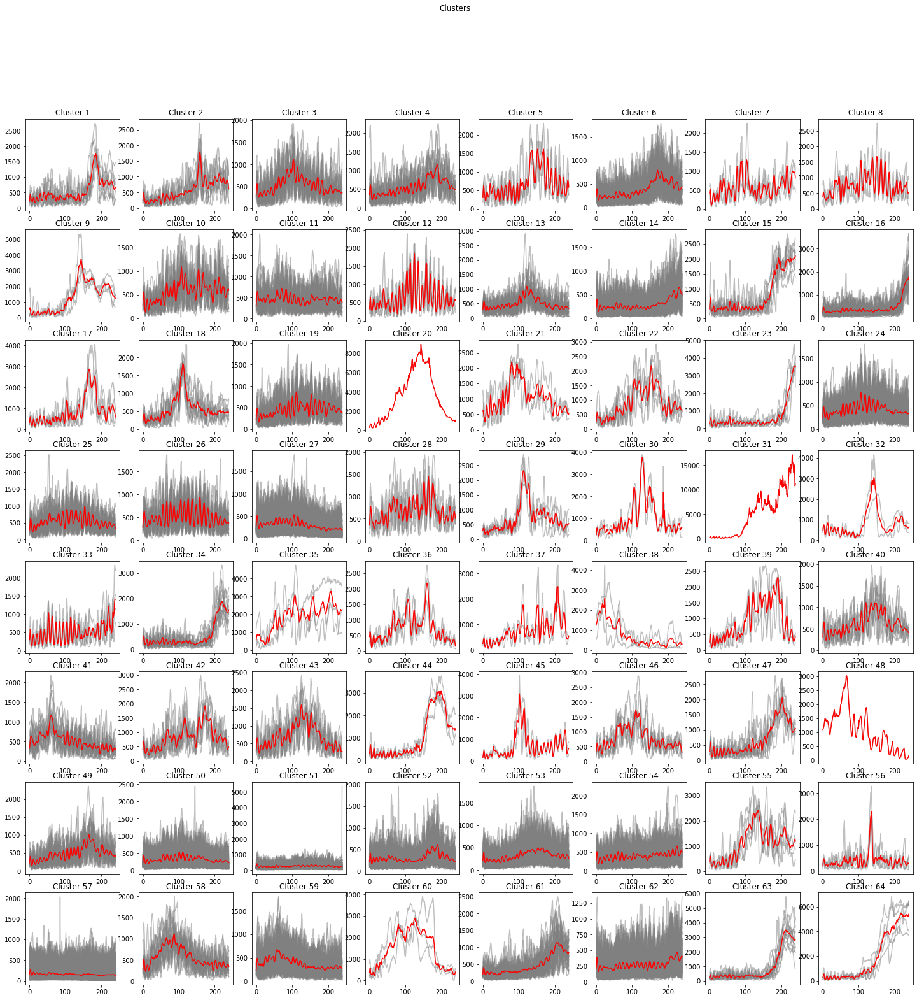

In [199]:
win_map = som.win_map(p53)
# Returns the mapping of the winner nodes and inputs
plot_som_series_averaged_center_eudist(som_x, som_y, win_map)

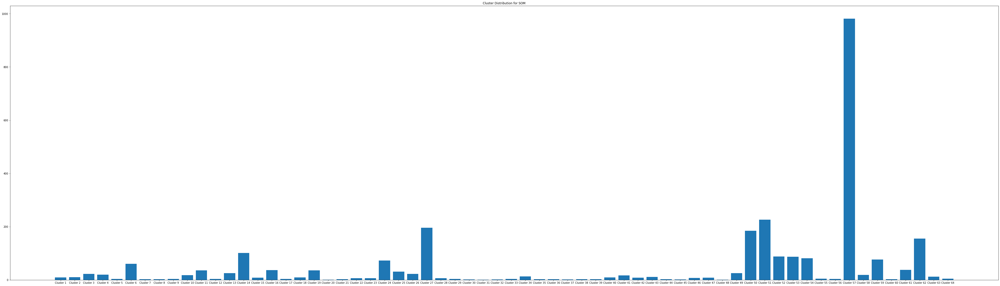

In [203]:
cluster_c = []
cluster_n = []
for x in range(som_x):
    for y in range(som_y):
        cluster = (x,y)
        if cluster in win_map.keys():
            cluster_c.append(len(win_map[cluster]))
        else:
            cluster_c.append(0)
        cluster_number = x*som_y+y+1
        cluster_n.append(f"Cluster {cluster_number}")

plt.figure(figsize=(70,20))
plt.title("Cluster Distribution for SOM")
plt.bar(cluster_n,cluster_c)
plt.show()

### MIXED CLUSTERING - Kmeans

### Cluster count = 2

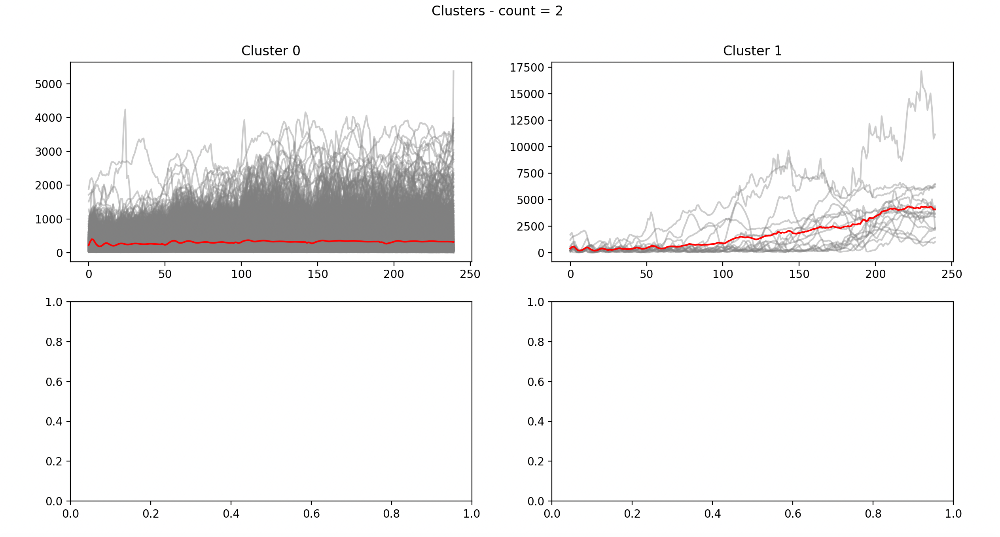

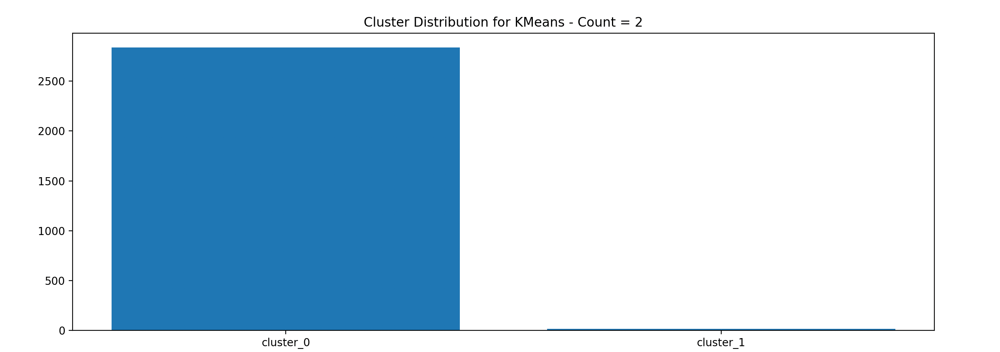

#### Cluster count = 3

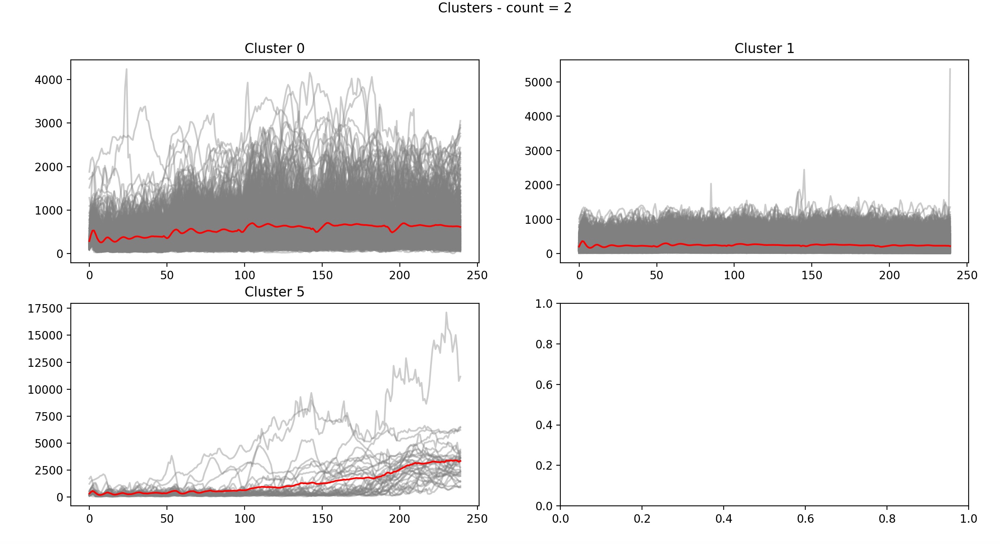

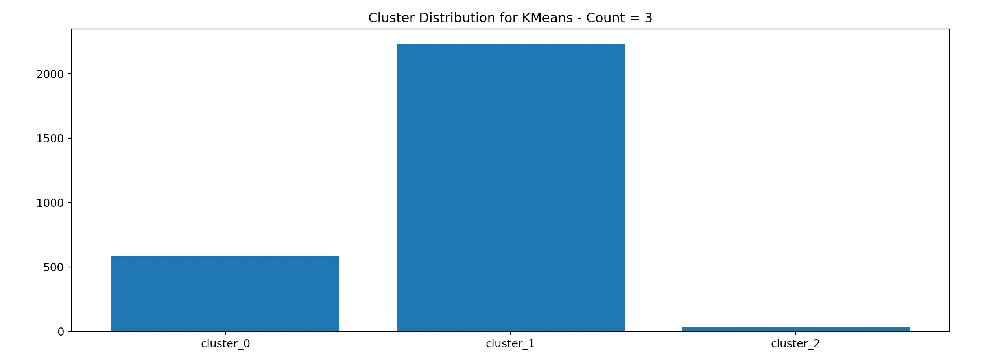

#### Cluster count = 4

#### Cluster count = 5